<a href="https://www.kaggle.com/code/cynthiandululu/final-image-captioning?scriptVersionId=237106721" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

### **Name:CYNTHIA MUTISYA**  
### **Neptun ID: A1PHRA**

## **0. Necessary Imports**
Import all the necessary packages for this assignment. **ONLY PYTORCH MODELS ARE ACCEPTED!**

### **Kaggle was used to help train data over many batches to help attain a good prediction as in google collabs , a notification of session crashed was being encountered**

### **This is because kaggle provides better GPU and RAM resources**

In [1]:
import os
import numpy as np
import pandas as pd
import torch
import re
import nltk
import torchvision
import torchaudio
import matplotlib.pyplot as plt
import random
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms
import matplotlib.image as mpimg
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader
import torch.nn as nn
import torchvision.models as models
from torchvision.models import ResNet50_Weights
import torch.optim as optim
from torch.utils.data import Subset
import torchvision.transforms.functional as TF
import numpy as np
import nltk
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")

## **1. Data Loading Process**


In [2]:
#!pip install -q kaggle

#from google.colab import files
#files.upload()
import kagglehub

# Download latest version
path = kagglehub.dataset_download("adityajn105/flickr8k")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/flickr8k


# **Downloading and unzipping the data**

In [3]:
'''!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json'''


'!mkdir -p ~/.kaggle\n!cp kaggle.json ~/.kaggle/\n!chmod 600 ~/.kaggle/kaggle.json'

In [4]:
'''!kaggle datasets download -d adityajn105/flickr8k'''

'!kaggle datasets download -d adityajn105/flickr8k'

In [5]:
'''!unzip flickr8k.zip -d flickr8k'''

'!unzip flickr8k.zip -d flickr8k'

### **1.1. Importing data as a dataframe**

In [6]:

captions_path = "/kaggle/input/flickr8k/captions.txt"
df = pd.read_csv(captions_path)
display(df.head())
display(df.shape)


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


(40455, 2)

### **The dataset size is of 40455 sample with images and captions**

### **1.2. Data Cleaning Process**

### **The process entails removing puntuctiations, foreign characters and spaces**

In [7]:
def clean_caption(text):
    return re.sub(r"[-'!;#()?]", '', text)
df['caption'] = df['caption'].apply(clean_caption)
df['caption'] = df['caption'].apply(lambda x: x.replace('.', ''))


### **Defining a function to show the Images with the captions**

In [8]:
def display_image_with_captions(df, image_name, image_dir="/kaggle/input/flickr8k/Images"):
    image_path = f"{image_dir}/{image_name}"
    # Load and show image
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')
    # Fetch and display captions
    captions = df[df['image'] == image_name]['caption'].tolist()
    plt.title('\n'.join(captions), fontsize=10)
    plt.show()


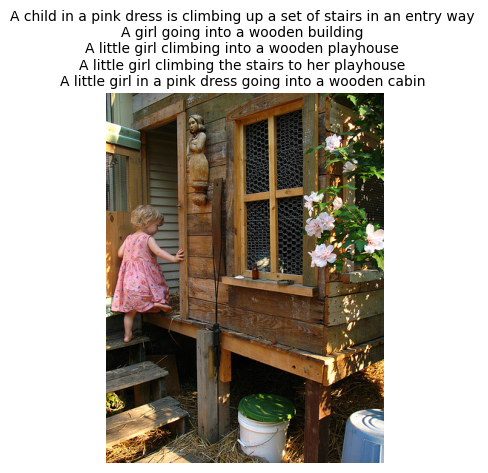

In [9]:
# Display the first image in the dataset
first_image = df['image'].iloc[0]
display_image_with_captions(df, first_image)


## **2. Defining Augmentations**


In [10]:

train_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  
        std=[0.229, 0.224, 0.225]    
    )
])

test_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
        transforms.Normalize(
        mean=[0.485, 0.456, 0.406],  
        std=[0.229, 0.224, 0.225]    
    )
])


## **3. Creating Datasets and Dataloaders**

### **Defining the Vocabulary Class**

In [11]:
class Vocabulary:
    def __init__(self, freq_threshold=5):
        # Defining special tokens
        self.freq_threshold = freq_threshold
        self.word2idx = {"<pad>": 0, "<sos>": 1, "<eos>": 2, "<unk>": 3}
        self.idx2word = {0: "<pad>", 1: "<sos>", 2: "<eos>", 3: "<unk>"}
        self.word_freq = {}
        self.index = 4 

    def build_vocabulary(self, sentence_list):
        for sentence in sentence_list:
            for word in sentence.lower().split():
                self.word_freq[word] = self.word_freq.get(word, 0) + 1
        for word, freq in self.word_freq.items():
            if freq >= self.freq_threshold:
                self.word2idx[word] = self.index
                self.idx2word[self.index] = word
                self.index += 1

        # Return vocabulary with frequencies
        return [(word, self.word_freq[word]) for word in self.word2idx.keys() if word in self.word_freq]

    def numericalize(self, sentence):
        tokens = [self.word2idx["<sos>"]] + [
            self.word2idx.get(word, self.word2idx["<unk>"])  
            for word in sentence.lower().split()
        ] + [self.word2idx["<eos>"]]  

        return tokens


### **Displaying the top vocabulary words**

In [12]:
vocab = Vocabulary(freq_threshold=5)
all_vocab=vocab.build_vocabulary(df['caption'])
vocab_size=len(vocab.word2idx)
display(vocab_size)


2998

### **Defining start and end tokenss**

In [13]:
start_token = vocab.word2idx["<sos>"]
end_token = vocab.word2idx["<eos>"]

In [14]:
print(vocab_size)

2998


### **A dataframe of top 7 vocabulary words**

In [15]:
all_vocab1=pd.DataFrame(all_vocab,columns=['word','frequency'])
all_vocab1.sort_values(by='frequency',ascending=False)
all_vocab1.head(7)


,word,frequency
0,a,62986
1,child,1545
2,in,18974
3,pink,735
4,dress,348
5,is,9345
6,climbing,502


### **A visual Plot of top 25 vocabulary words**

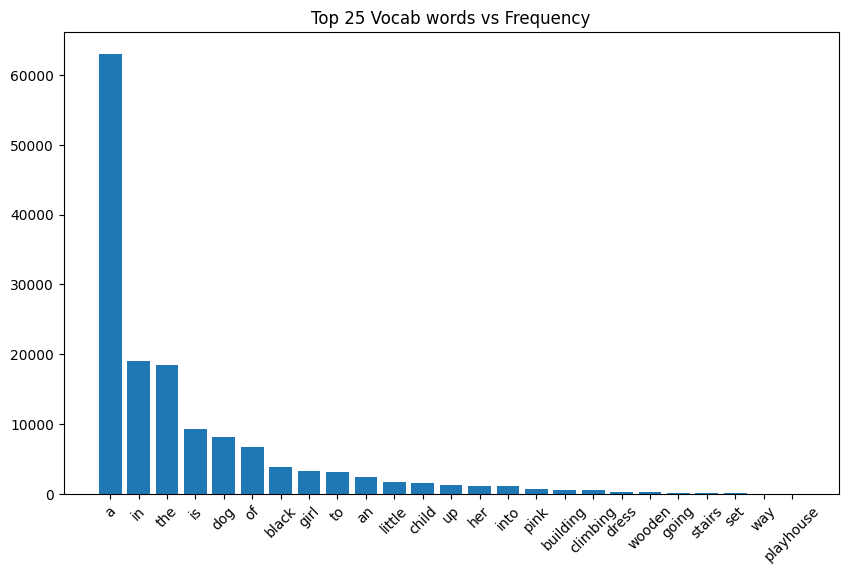

In [16]:
vocab_df=all_vocab1[:25].sort_values(by='frequency',ascending=False)
plt.figure(figsize=(10, 6))
plt.bar(range(len(vocab_df)), vocab_df['frequency'].values)
plt.xticks(range(len(vocab_df)), vocab_df['word'].values, rotation=45)
plt.title("Top 25 Vocab words vs Frequency")
plt.show()

### **Creating a tokenized column by numericalizing captions in the dataframe**

In [17]:

df['tokenized_caption'] = df['caption'].apply(lambda x: vocab.numericalize(x))
df.head()

,image,caption,tokenized_caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,"[1, 4, 5, 6, 4, 7, 8, 9, 10, 11, 4, 12, 13, 14..."
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building,"[1, 4, 17, 18, 19, 4, 20, 21, 2]"
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse,"[1, 4, 22, 17, 10, 19, 4, 20, 23, 2]"
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...,"[1, 4, 22, 17, 10, 24, 14, 25, 26, 23, 2]"
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...,"[1, 4, 22, 17, 6, 4, 7, 8, 18, 19, 4, 20, 3, 2]"


### **Displaying a sample token. This can be seen the start has token 1 and end has token 2 as defined earlier**

In [18]:
numericalized_caption = torch.tensor(df['tokenized_caption'].iloc[10])
numericalized_caption

tensor([ 1,  4, 22, 17, 54,  6, 55, 56,  6, 57, 13,  4, 58, 59, 35, 26, 60,  6,
         4, 61,  2])

## **Defining the Dataset Class**

In [19]:
class FlickrDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform, vocab):
        self.df = dataframe
        self.image_dir = image_dir
        self.transform = transform
        self.vocab = vocab

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = f"{self.image_dir}/{row['image']}"
        caption = row['caption']

        # Loading and transforming image
        image = Image.open(img_path)
        if self.transform:
            image = self.transform(image)

        # Numericalizing the caption 
        numericalized_caption = row['tokenized_caption']
        numericalized_caption = torch.tensor(numericalized_caption)


        return image, numericalized_caption,caption


### **Splittng data into train, test and validation parts**
### **The data is first reshuffled and 70% train, 15% test , 15% test**


In [20]:
shuffled_df = df.sample(frac=1, random_state=42).reset_index(drop=True)
# Split into 70% train and 30% 
train_df, temp_df = train_test_split(shuffled_df, test_size=0.3, random_state=42)
# Splitting the 30% into test and val
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)

### **Getting the length of the datasets**

In [21]:
print(f"Training set size: {len(train_df)}")
print(f"Validation set size: {len(val_df)}")
print(f"Test set size: {len(test_df)}")

Training set size: 28318
Validation set size: 6068
Test set size: 6069


In [22]:
train_df.head()

,image,caption,tokenized_caption
9534,2120469056_7a738413be.jpg,Two children swimming in green water,"[1, 46, 412, 229, 6, 121, 136, 2]"
18200,3534824784_7133119316.jpg,A woman and a young girl sit close and pose fo...,"[1, 4, 223, 29, 4, 72, 17, 243, 775, 29, 372, ..."
23075,1356543628_c13ebe38fb.jpg,"Little girl in rural area , carrying bags and ...","[1, 22, 17, 6, 688, 448, 128, 282, 1408, 29, 9..."
8377,337647771_3b819feaba.jpg,The dog has his face in the bag of Christmas p...,"[1, 24, 28, 283, 78, 191, 6, 24, 1205, 13, 213..."
18684,108899015_bf36131a57.jpg,Skiiers at the top of a snow covered hill,"[1, 605, 44, 24, 357, 13, 4, 169, 54, 327, 2]"


### **Creating Train, Test and Val Dataset**

In [23]:
train_dataset = FlickrDataset(train_df, image_dir="/kaggle/input/flickr8k/Images", transform=train_transform, vocab=vocab)
val_dataset   = FlickrDataset(val_df,   image_dir="/kaggle/input/flickr8k/Images", transform=train_transform, vocab=vocab)
test_dataset  = FlickrDataset(test_df,  image_dir="/kaggle/input/flickr8k/Images", transform=test_transform, vocab=vocab)

### **Getting the first record of the train_dataset to see its representation**

In [24]:
train_dataset[0]

(tensor([[[-1.0733, -1.1247, -1.1075,  ..., -1.9809, -1.9809, -2.0323],
          [-0.9705, -1.0390, -1.0390,  ..., -1.9638, -1.9980, -1.9295],
          [-1.0048, -1.0390, -0.9877,  ..., -1.8953, -1.9467, -1.7754],
          ...,
          [ 1.7523,  1.7694,  1.8208,  ...,  0.3994,  0.4166,  0.2453],
          [ 1.7694,  1.7694,  1.6667,  ...,  0.3994,  0.4337,  0.3652],
          [ 1.7523,  1.7865,  1.6838,  ..., -0.0116,  0.0056,  0.0056]],
 
         [[-1.0028, -1.0203, -1.0378,  ..., -1.8431, -1.8431, -1.8431],
          [-0.9853, -1.0028, -0.9503,  ..., -1.8431, -1.8431, -1.8081],
          [-0.9503, -1.0378, -1.0028,  ..., -1.7906, -1.7906, -1.6331],
          ...,
          [ 1.6583,  1.6758,  1.7283,  ...,  0.5203,  0.5553,  0.3978],
          [ 1.6933,  1.6758,  1.5532,  ...,  0.5378,  0.5903,  0.5378],
          [ 1.6758,  1.6758,  1.5707,  ..., -0.0924, -0.0399, -0.0049]],
 
         [[-0.9156, -0.9678, -0.9504,  ..., -1.6476, -1.6650, -1.6476],
          [-0.8807, -0.9330,

### **Defining a Padding function for the captions**

In [25]:

def collate_fn(batch):
    images = []
    tensor_captions = []
    original_captions = []
    for img, caption_tensor, caption_str in batch:
        images.append(img)
        tensor_captions.append(caption_tensor)
        original_captions.append(caption_str)
    images = torch.stack(images)
    te_captions = pad_sequence(tensor_captions, batch_first=True, padding_value=0)

    return images, te_captions, original_captions  


### **Creating Data Loaders of batch size 8**

In [26]:

batch_size=8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
val_loader   = DataLoader(val_dataset,   batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
test_loader  = DataLoader(test_dataset,  batch_size=batch_size, shuffle=False, collate_fn=collate_fn)


### **Displaying components of a single batch**

In [27]:
for images,te_captions,_ in train_loader:
    print("Images shape:", images.shape)
    print("Tensor Captions shape:", te_captions.shape)
    break



Images shape: torch.Size([8, 3, 256, 256])
Tensor Captions shape: torch.Size([8, 16])


In [28]:
for images,te_captions,_ in val_loader:
    print("Images shape:", images.shape)
    print("Tensor Captions shape:", te_captions.shape)
    break

Images shape: torch.Size([8, 3, 256, 256])
Tensor Captions shape: torch.Size([8, 19])


In [29]:
vocab = Vocabulary(freq_threshold=5)
all_vocab=vocab.build_vocabulary(df['caption'])
vocab_size=len(vocab.word2idx)
display(vocab_size)

2998

### **Converting Tokens back to Captions to confirm tokenization was done right**

In [30]:
def tensor_to_caption(tensor, vocab):
    words = []
    for idx in tensor:
        word = vocab.idx2word[idx.item()]
        if word not in ("<pad>", "<sos>", "<eos>"):
            words.append(word)
    return " ".join(words)


caption = train_loader.dataset[1][1]
translated_caption = tensor_to_caption(caption, vocab)
print(translated_caption)


a woman and a young girl sit close and pose for a photo


## **4.1 Visualizing Training Data**


In [31]:
vocab = Vocabulary(freq_threshold=5)
all_vocab=vocab.build_vocabulary(df['caption'])
vocab_size=len(vocab.word2idx)
display(vocab_size)


2998

## **Define an unnormalization function**


In [32]:
vocab = {row['word']: row['frequency'] for _, row in all_vocab1.iterrows()}

# Define the mean and std values used during normalization
mean = torch.tensor([0.485, 0.456, 0.406])
std = torch.tensor([0.229, 0.224, 0.225])
# Function to unnormalize an image tensor
def unnormalize_image(image, mean, std):
    for c in range(3):  
        image[c] = image[c] * std[c] + mean[c]
    return image


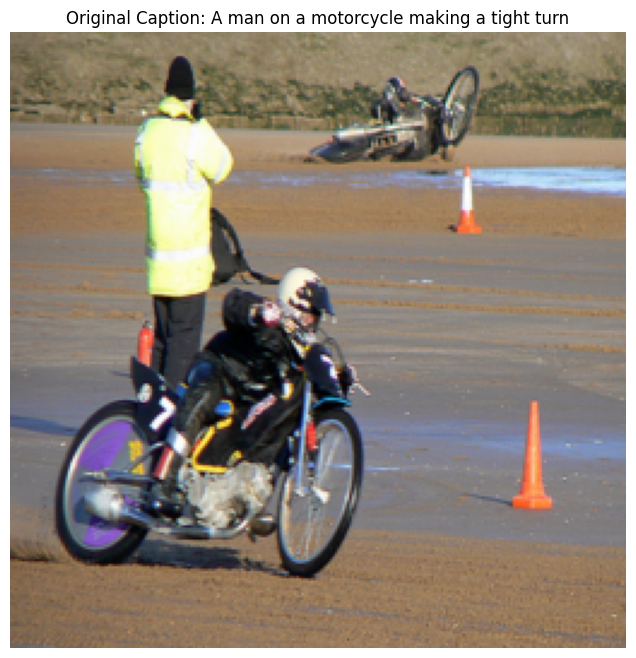

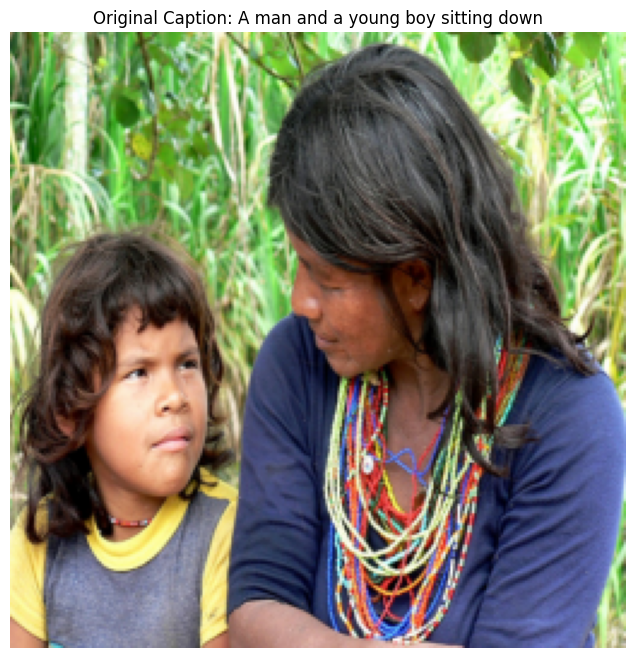

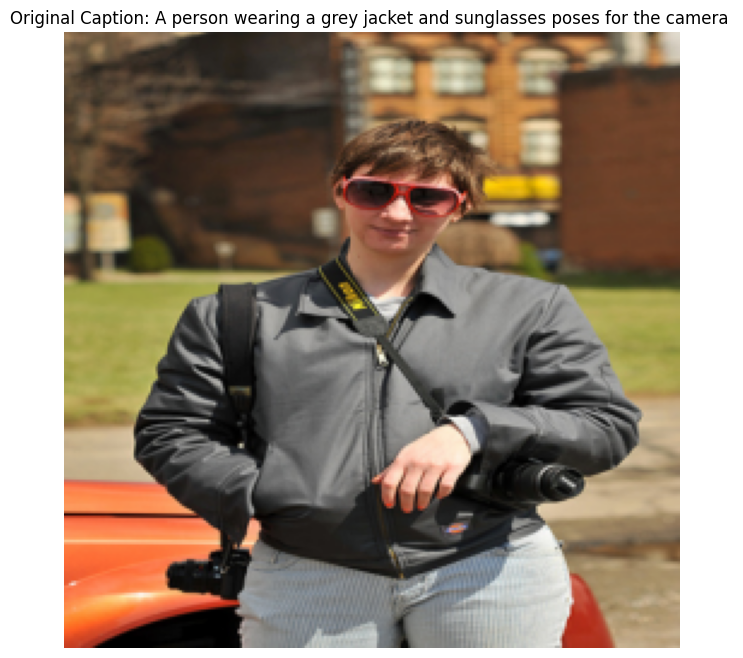

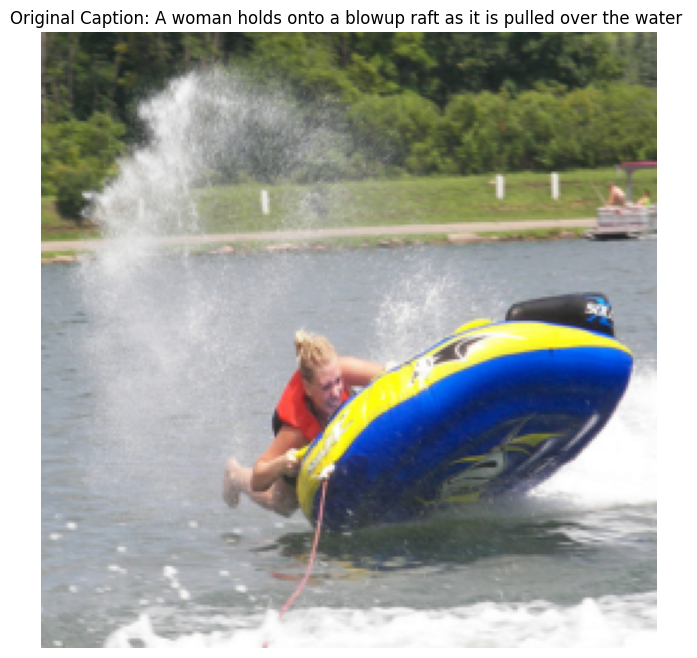

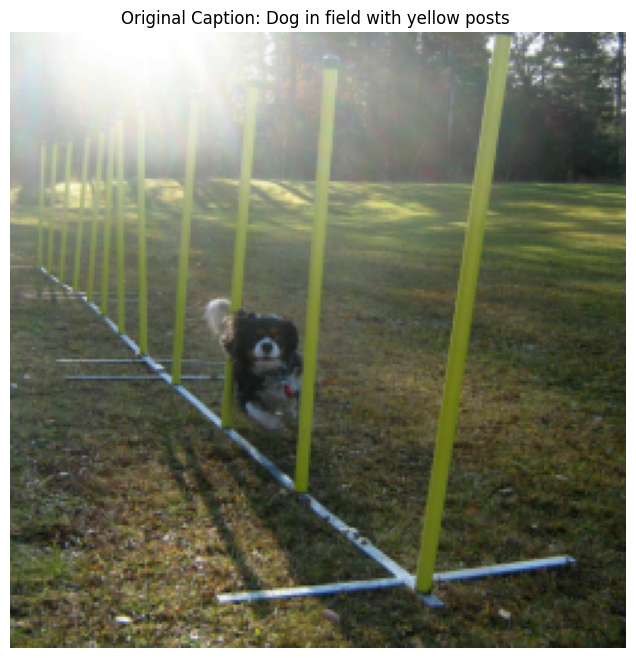

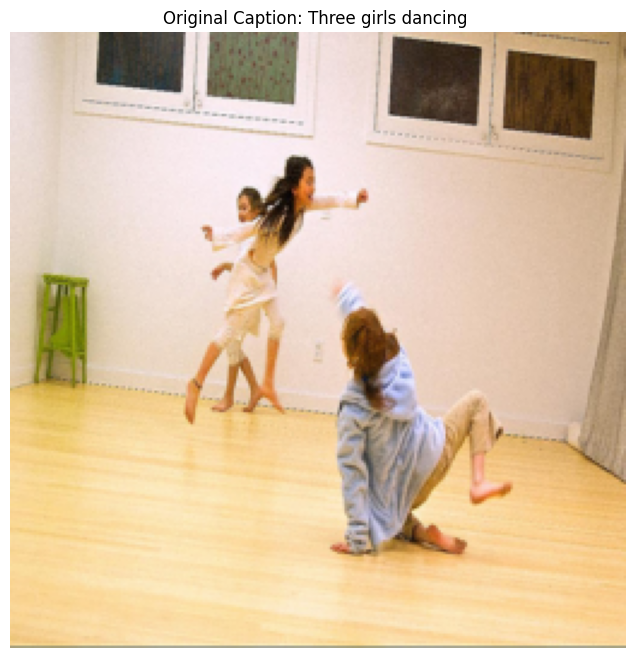

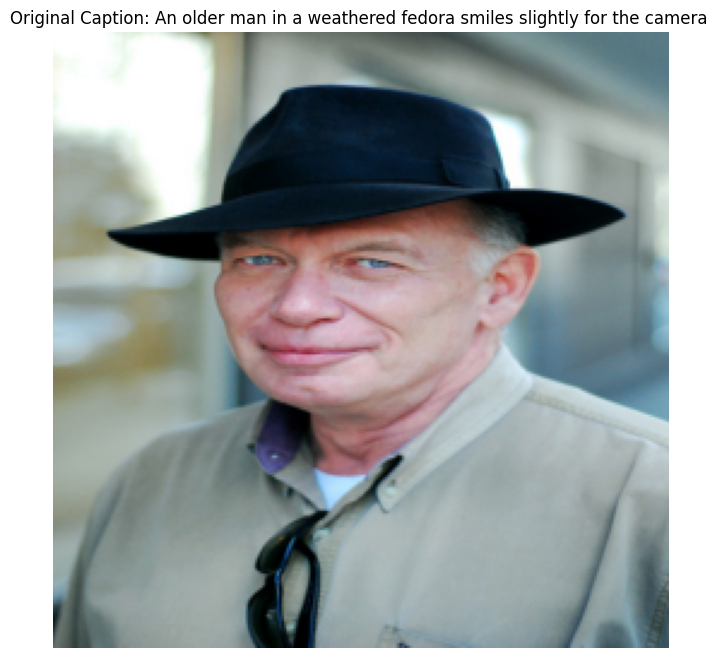

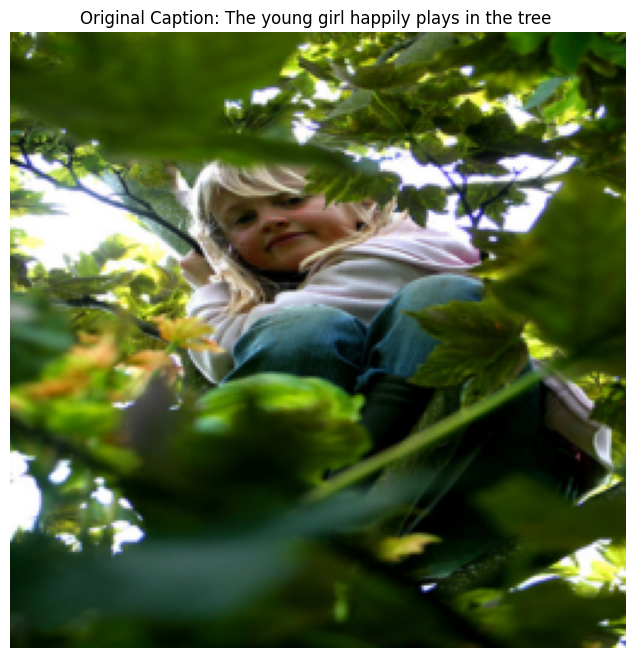

In [33]:
#Visualize the first batch of train data
for images, tensor_captions, original_captions in train_loader:
    for i in range(len(images)):
        img = images[i]
        caption_tensor = tensor_captions[i]
        original_caption = original_captions[i]
        # Undo normalization
        unnormalized_img = unnormalize_image(img.clone(), mean, std)
        # Convert tensor back to PIL image for visualization
        img_np = TF.to_pil_image(unnormalized_img)
        # Join the decoded tokens to form the caption string
        decoded_caption = [vocab.get(idx.item(), "<unk>") for idx in caption_tensor if idx.item() != 0]  # Skip padding token (0)


        # Plot the image and show the caption
        plt.figure(figsize=(8, 8))
        plt.imshow(img_np)
        plt.axis('off')  # Hide axes
        plt.title(f"Original Caption: {original_caption}")
        plt.show()

    break 


## **4.2 Creating the Image Captioning Model**



In [34]:

# Defining the Encoder using ResNet50
class ResNetEncoder(nn.Module):
    def __init__(self, embed_dim):
        super(ResNetEncoder, self).__init__()
        resnet = models.resnet50(weights=ResNet50_Weights.DEFAULT)
        self.resnet = nn.Sequential(*list(resnet.children())[:-2])  
        self.conv = nn.Conv2d(2048, embed_dim, kernel_size=1)  
        
    def forward(self, images):
        with torch.no_grad():
            features = self.resnet(images)  
        features = self.conv(features)  
        features = features.view(features.size(0), features.size(1), -1)  
        features = features.permute(0, 2, 1)  
        return features




In [35]:
# Define the Attention Mechanism
class Attention(nn.Module):
    def __init__(self, embed_dim):
        super(Attention, self).__init__()
        self.attention_layer = nn.Linear(embed_dim, embed_dim)
        self.context_vector = nn.Parameter(torch.randn(embed_dim))

    def forward(self, features, hidden_state):
        # Calculating attention scores 
        attention_scores = torch.matmul(features, self.attention_layer(hidden_state).unsqueeze(2)).squeeze(2)
        attention_weights = torch.softmax(attention_scores, dim=1)  
        attended_features = torch.sum(attention_weights.unsqueeze(2) * features, dim=1)
        return attended_features, attention_weights



In [36]:
class DecoderLSTM(nn.Module):
    def __init__(self, embed_dim, hidden_dim, vocab_size, num_layers=1):
        super(DecoderLSTM, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.lstm = nn.LSTM(embed_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, vocab_size)
        self.attention = Attention(embed_dim)
        self.proj = nn.Linear(embed_dim * 2, embed_dim)  

    def forward(self, features, captions):
        captions_in = captions[:, :-1]  
        embedded_captions = self.embedding(captions_in)

        h0 = torch.zeros(1, features.size(0), embedded_captions.size(-1)).to(features.device)
        c0 = torch.zeros(1, features.size(0), embedded_captions.size(-1)).to(features.device)

        hidden_state = h0
        lstm_output = []
        context_vectors = []

        for t in range(captions_in.size(1)):
            attended_features, attention_weights = self.attention(features, hidden_state.squeeze(0))
            context_vectors.append(attended_features)
            lstm_input = torch.cat((embedded_captions[:, t, :], attended_features), dim=1)
            lstm_input = self.proj(lstm_input).unsqueeze(1)
            lstm_out, (hidden_state, cell_state) = self.lstm(lstm_input, (h0, c0))
            output = self.fc(lstm_out.squeeze(1)) 
            lstm_output.append(output)
        lstm_output = torch.stack(lstm_output, dim=1)
        attention_weights = torch.stack(context_vectors, dim=1)
        return lstm_output, context_vectors, attention_weights



In [37]:
# Combining the Encoder, Attention, and Decoder into one Model
class ImageCaptioningModel(nn.Module):
    def __init__(self, encoder, decoder):
        super(ImageCaptioningModel, self).__init__()
        self.encoder = encoder
        self.decoder = decoder
    def forward(self, images, captions):
        #generate features from Image
        features = self.encoder(images)  
        # Generating captions using LSTM
        outputs, context_vectors,attention_weights = self.decoder(features, captions)  
        return outputs, context_vectors,attention_weights


## **5. Defining Loss Function and Optimizer- Bleu Score**

In [38]:

chencherry = SmoothingFunction()
def bleu_scores(reference, predicted):
    bleu1 = sentence_bleu(reference, predicted, weights=(1, 0, 0, 0), smoothing_function=chencherry.method1)
    bleu2 = sentence_bleu(reference, predicted, weights=(0, 1, 0, 0), smoothing_function=chencherry.method1)
    bleu3 = sentence_bleu(reference, predicted, weights=(0, 0, 1, 0), smoothing_function=chencherry.method1)
    bleu4 = sentence_bleu(reference, predicted, weights=(0, 0, 0, 1), smoothing_function=chencherry.method1)
    
    print(f"BLEU-1: {bleu1:.4f}")
    print(f"BLEU-2: {bleu2:.4f}")
    print(f"BLEU-3: {bleu3:.4f}")
    print(f"BLEU-4: {bleu4:.4f}")


## **6. Training the Image Captioning Model**


### **Subsetting the batches as not all batches will be used**

In [39]:
#counting the number of batches in train and val loader
len(train_loader), len(val_loader)

(3540, 759)

In [40]:


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

embed_dim = 256
hidden_dim = 256
encoder = ResNetEncoder(embed_dim).to(device)
decoder = DecoderLSTM(embed_dim, hidden_dim, vocab_size).to(device)
model = ImageCaptioningModel(encoder, decoder).to(device)

optimizer = optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.CrossEntropyLoss(ignore_index=0)
num_epochs = 20

# Function to subset the DataLoaders 
def subset_loader(loader, num_batches):
    batch_list = []
    for i, (images, captions, _) in enumerate(loader):
        if i >= num_batches:
            break
        batch_list.append((images, captions))
    return batch_list

# Subset the train and validation loaders for the first 5 batches
train_batches = subset_loader(train_loader, num_batches=2000)
val_batches = subset_loader(val_loader, num_batches=759)
print(len(train_batches))

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 213MB/s]


2000


In [41]:

# Initializing lists to store loss and epoch data
train_losses = []
val_losses = []
epochs = []

# Early Stopping 
patience = 3   
best_val_loss = float('inf')
patience_counter = 0

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    batch_count = 0

    # Training phase
    for images, captions in train_batches:
        images = images.to(device)
        captions = captions.to(device)

        optimizer.zero_grad()

        outputs, _, _ = model(images, captions)
        targets = captions[:, 1:]

        outputs = outputs.reshape(-1, vocab_size)
        targets = targets.reshape(-1)

        loss = criterion(outputs, targets)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        batch_count += 1

    avg_train_loss = running_loss / batch_count

    # Validation phase
    model.eval()
    val_loss = 0.0
    val_batch_count = 0
    with torch.no_grad():
        for images, captions in val_batches:
            images = images.to(device)
            captions = captions.to(device)
            outputs, _, _ = model(images, captions)
            targets = captions[:, 1:]

            outputs = outputs.reshape(-1, vocab_size)
            targets = targets.reshape(-1)

            loss = criterion(outputs, targets)

            val_loss += loss.item()
            val_batch_count += 1

    avg_val_loss = val_loss / val_batch_count
    print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}")

    # Storing losses and epoch number
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)
    epochs.append(epoch + 1)

    # Early stopping 
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        patience_counter = 0
        # Saving the best model
        torch.save(model.state_dict(), "best_model.pth")  
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}")
            break


Epoch [1/20], Training Loss: 4.8948, Validation Loss: 4.4173
Epoch [2/20], Training Loss: 4.2255, Validation Loss: 4.0941
Epoch [3/20], Training Loss: 3.9774, Validation Loss: 3.9298
Epoch [4/20], Training Loss: 3.8190, Validation Loss: 3.8209
Epoch [5/20], Training Loss: 3.7012, Validation Loss: 3.7441
Epoch [6/20], Training Loss: 3.6065, Validation Loss: 3.6861
Epoch [7/20], Training Loss: 3.5269, Validation Loss: 3.6479
Epoch [8/20], Training Loss: 3.4578, Validation Loss: 3.6136
Epoch [9/20], Training Loss: 3.3964, Validation Loss: 3.5853
Epoch [10/20], Training Loss: 3.3412, Validation Loss: 3.5633
Epoch [11/20], Training Loss: 3.2891, Validation Loss: 3.5477
Epoch [12/20], Training Loss: 3.2433, Validation Loss: 3.5286
Epoch [13/20], Training Loss: 3.1969, Validation Loss: 3.5183
Epoch [14/20], Training Loss: 3.1561, Validation Loss: 3.5091
Epoch [15/20], Training Loss: 3.1152, Validation Loss: 3.5060
Epoch [16/20], Training Loss: 3.0811, Validation Loss: 3.4958
Epoch [17/20], Tr

## **7.1 Visualizing Training Metrics**



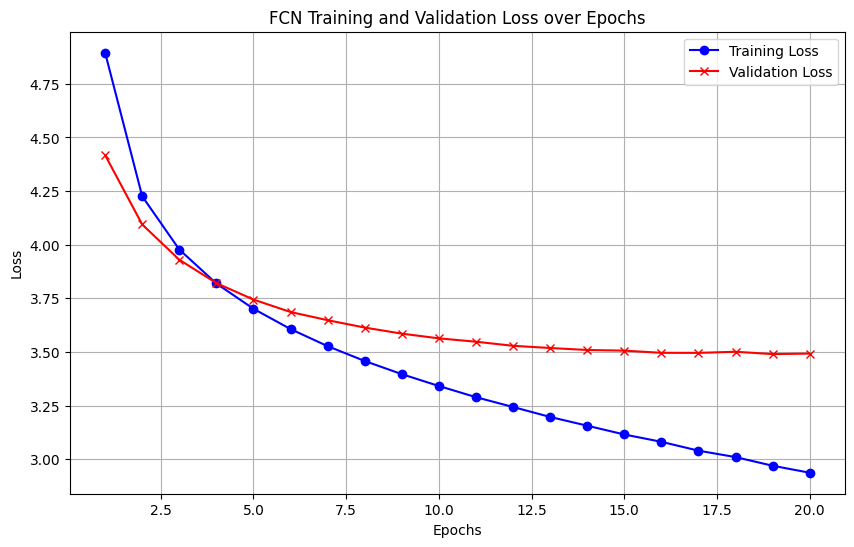

In [42]:

def plot_losses(epochs, train_losses, val_losses):
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_losses, label="Training Loss", color='blue', marker='o')
    plt.plot(epochs, val_losses, label="Validation Loss", color='red', marker='x')
    plt.title('FCN Training and Validation Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
plot_losses(epochs, train_losses, val_losses)

## **Over the epchos the training and validation losses converge but the training loss converges faster than the validation loss**


## **7.2 Visualizing Attention Weights**



In [43]:
test_dataset[0]

(tensor([[[-1.3130, -1.3302, -1.1760,  ..., -1.7754, -1.9638, -2.0665],
          [-1.1932, -1.2445, -1.1932,  ..., -1.8610, -1.8610, -2.0323],
          [-0.9363, -0.9534, -0.9020,  ..., -1.9467, -1.5185, -1.7754],
          ...,
          [-0.5082, -0.1143, -0.4397,  ..., -0.5253, -0.6452, -0.4739],
          [-0.3712, -0.0116, -0.1143,  ..., -0.8164, -0.6109, -0.3712],
          [-0.4226, -0.4397, -0.4226,  ..., -0.6794, -0.3883, -0.6109]],
 
         [[-0.7052, -0.6877, -0.5826,  ..., -0.3550, -0.9328, -1.6331],
          [-0.5476, -0.6001, -0.5651,  ..., -0.5651, -1.0903, -1.7556],
          [-0.2850, -0.3025, -0.2850,  ..., -0.8978, -0.8627, -1.5105],
          ...,
          [ 0.0301,  0.1702, -0.2325,  ...,  0.0126, -0.0049,  0.1702],
          [-0.0924,  0.2052,  0.1702,  ..., -0.1450,  0.0651,  0.2927],
          [ 0.0126,  0.0126,  0.0826,  ...,  0.0826,  0.1877,  0.0126]],
 
         [[-1.1770, -1.1770, -1.0550,  ...,  0.9319,  0.0256, -1.1247],
          [-1.0376, -1.1073,

### **Defining the test loader with batch 1 to predict the caption of the first image**

In [44]:
test_loader  = DataLoader(test_dataset,  batch_size=1, shuffle=False, collate_fn=collate_fn)
for images,te_captions,captions in test_loader:
    print("Images shape:", images.shape)
    print("Tensor Captions shape:", te_captions.shape)
    img_tensor=images
    image=images
    tensor_cap=te_captions
    image = image.squeeze(0)
    referencewords=captions
    print(referencewords)
    break
reference_words = referencewords[0].strip().split()



Images shape: torch.Size([1, 3, 256, 256])
Tensor Captions shape: torch.Size([1, 18])
['A young boy kicks a soccer ball while six others play but are dressed as referee ']


### **Unnormalizing the image inorder to display in RGB formats**

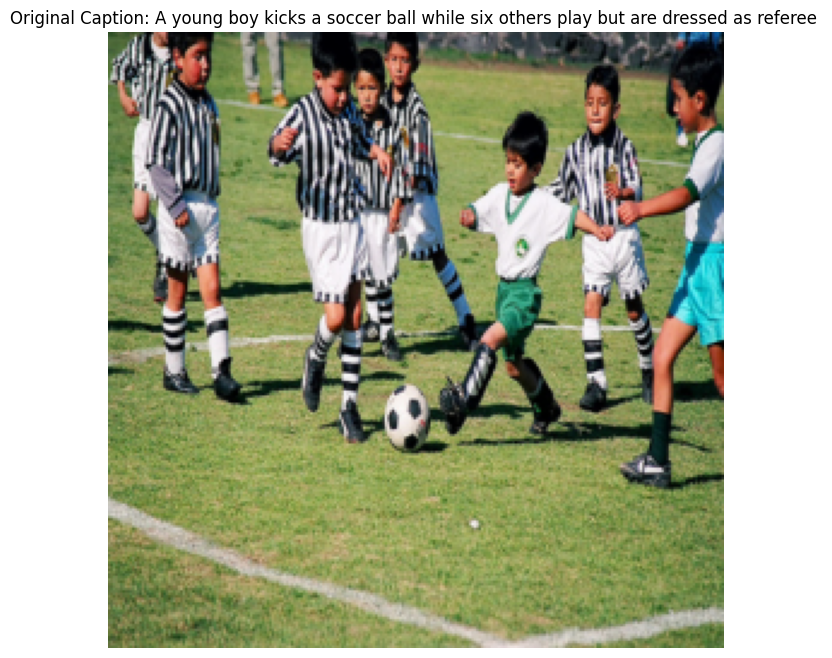

In [45]:

unnormalized_img = unnormalize_image(image.clone(), mean, std)
img_np = TF.to_pil_image(unnormalized_img)    
plt.figure(figsize=(8, 8))
plt.imshow(img_np)
plt.axis('off') 
plt.title(f"Original Caption: {captions[0]}")
plt.show()



In [46]:
vocab = Vocabulary(freq_threshold=5)
all_vocab=vocab.build_vocabulary(df['caption'])
vocab_size=len(vocab.word2idx)
display(vocab_size)


2998

## **Function to Visualize attention weights**


In [47]:

def visualize_attention(image, attention_weights, generated_words, save_path=None):
    if isinstance(image, torch.Tensor):
        image = TF.to_pil_image(image.squeeze(0).cpu())
    num_words = len(generated_words)
    grid_size = int(np.ceil(np.sqrt(num_words)))
    fig = plt.figure(figsize=(15, 15))
    for t in range(num_words):
        ax = fig.add_subplot(grid_size, grid_size, t + 1)
        ax.set_title(generated_words[t])

        # Get attention weights for the current word
        attention = attention_weights[t].cpu().detach().numpy()
        # Clip the attention values to make them more visually interpretable
        attention = np.clip(attention, 0, 1)
        # Resize attention to match image size
        attention_resized = TF.resize(TF.to_pil_image(torch.tensor(attention).unsqueeze(0)), image.size)
        # Overlay the attention map on the image
        ax.imshow(image)
        ax.imshow(attention_resized, cmap='jet', alpha=0.5)
        ax.axis('off')  
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path)
    plt.show()



## **Setting model to evaluation mode and visualizing attention weights**


In [48]:
vocab = Vocabulary(freq_threshold=5)
all_vocab=vocab.build_vocabulary(df['caption'])
vocab_size=len(vocab.word2idx)
display(vocab_size)


2998

Image shape: torch.Size([1, 3, 256, 256])
Generated Caption: a boy in a soccer ball <eos>


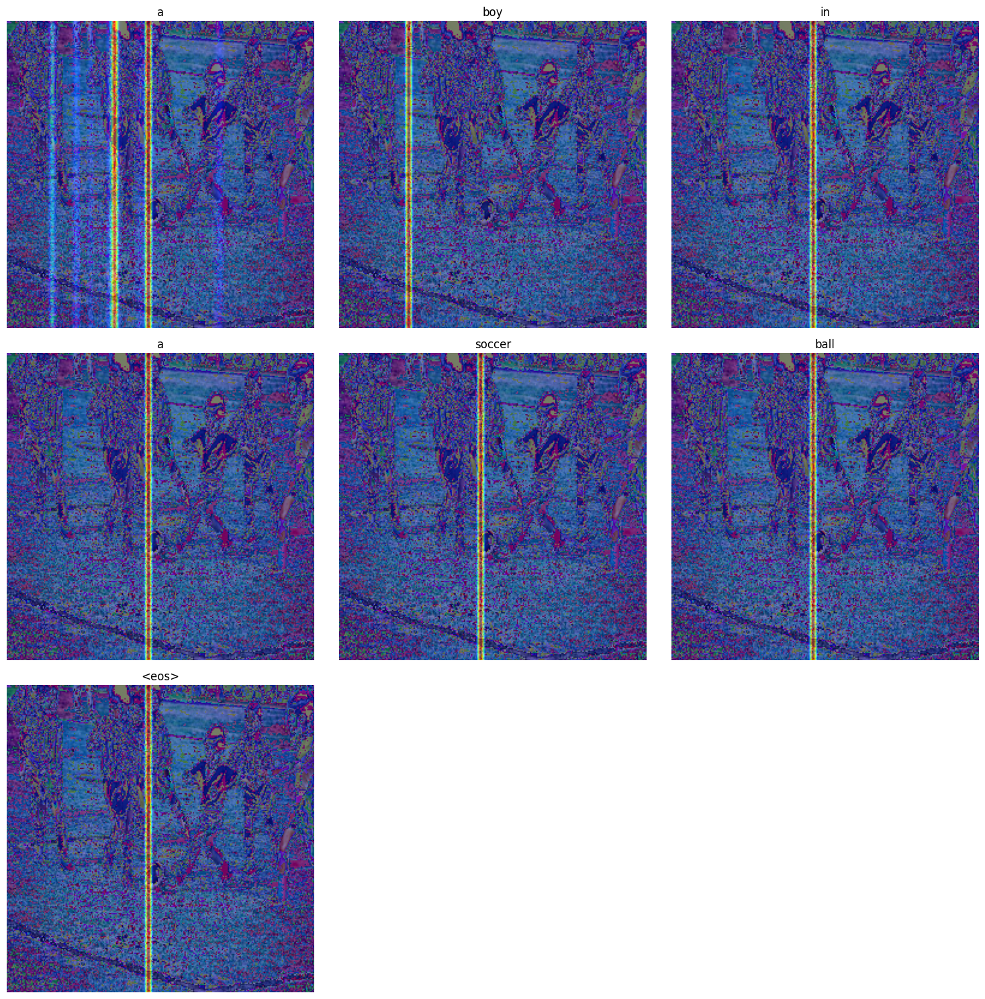

In [49]:
# Inference setup
model.eval()  
with torch.no_grad():  
    image = img_tensor.squeeze(1).to(device)  
    print(f"Image shape: {image.shape}")  

    features = model.encoder(image)  

    # Initialize the caption with <SOS> token
    caption = torch.tensor([[start_token]]).to(device)
    generated_words = []  
    attention_maps = []  

    # Initialize hidden and cell states of the LSTM
    hidden_state = torch.zeros(1, 1, embed_dim).to(device)
    cell_state = torch.zeros(1, 1, embed_dim).to(device)

    for _ in range(20):  
        embedded = model.decoder.embedding(caption[:, -1])  
        attended_features, attention_weights = model.decoder.attention(features, hidden_state.squeeze(0))

        # Store attention weights
        attention_maps.append(attention_weights.squeeze(0))  
        # Concatenate embedded word and attended features for LSTM input
        lstm_input = torch.cat((embedded.squeeze(1), attended_features), dim=1)
        lstm_input = model.decoder.proj(lstm_input).unsqueeze(1)  
        lstm_out, (hidden_state, cell_state) = model.decoder.lstm(lstm_input, (hidden_state, cell_state))
        output = model.decoder.fc(lstm_out.squeeze(1))

        predicted = output.argmax(1)  
        word = vocab.idx2word[predicted.item()]  
        generated_words.append(word)  

        # Stop generating if <EOS> token is predicted
        if predicted.item() == end_token:
            break

        # Update caption with the predicted word for the next step
        caption = torch.cat((caption, predicted.unsqueeze(1)), dim=1)

print(f"Generated Caption: {' '.join(generated_words)}")
single_image = img_tensor.squeeze(0)
visualize_attention(single_image, attention_maps, generated_words)


## **7.3 Running Inference on the Image Captioning Model**


In [50]:
generated_words=[i for i in generated_words if i != ('<eos>')]
generated_words

['a', 'boy', 'in', 'a', 'soccer', 'ball']

In [51]:
nltk.download('punkt')


[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [52]:

bleu_scores([reference_words], generated_words)


BLEU-1: 0.1259
BLEU-2: 0.0756
BLEU-3: 0.0472
BLEU-4: 0.0063


## **8. Loading an Existing Image Captioning Model**


In [53]:
from transformers import BlipProcessor, BlipForConditionalGeneration

# Load pre-trained BLIP model and processor
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model_pretrained = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")



2025-04-30 21:32:46.062430: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746048766.332771      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746048766.399801      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/990M [00:00<?, ?B/s]

In [54]:
# Preprocess the image and generate caption
inputs = processor(img_np, return_tensors="pt")
out = model_pretrained.generate(**inputs)
# Decode and print the caption
caption_pretrained = processor.decode(out[0], skip_special_tokens=True)
print(caption_pretrained)


a group of children playing soccer on a field


In [55]:
predict_predicted=[]
for word in caption_pretrained.split():
    predict_predicted.append(word)
predict_predicted


['a', 'group', 'of', 'children', 'playing', 'soccer', 'on', 'a', 'field']

## **9. Evaluating the Existing Image Captioning Model**

For evaluation, apply the **same metrics** used in the assessment of your custom image captioning model to ensure a consistent and fair comparison.

## **Pretrained Model Blue Scores**


In [56]:

bleu_scores([reference_words],predict_predicted)


BLEU-1: 0.1021
BLEU-2: 0.0057
BLEU-3: 0.0066
BLEU-4: 0.0077


## **Own Model Blue Scores**


In [57]:
bleu_scores([reference_words], generated_words)


BLEU-1: 0.1259
BLEU-2: 0.0756
BLEU-3: 0.0472
BLEU-4: 0.0063


## **10. Comparing the Two Models**


>### **Answer :For all bleu scores, the pretrained model obtained a higher score. This means the pretrained model has a better translation capacity**

In [58]:

def display_image_with_predcaptions(img,reference_caption, custom_prediction, pretrained_prediction):
    plt.figure(figsize=(8,6))
    plt.imshow(img)
    plt.axis('off')
    # Display captions
    plt.title(f"Ground Truth: {reference_caption}\n"
              f"Custom Model: {custom_prediction}\n"
              f"Pretrained Model: {pretrained_prediction}",
              fontsize=10, loc='left')

    plt.tight_layout()
    plt.show()


## **A plot showing the image with original caption, caption generated from pretrained model and caption from custom model**


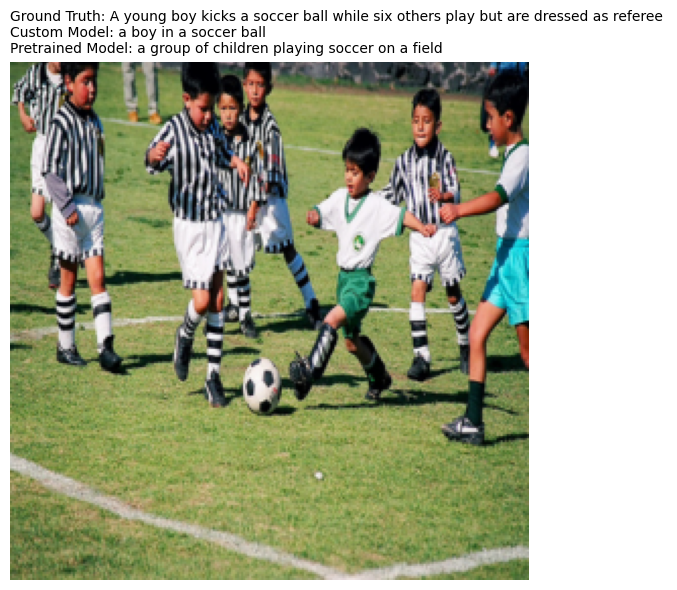

In [59]:


display_image_with_predcaptions(img_np,
    reference_caption=referencewords[0],
    custom_prediction=(' '.join(generated_words)),
    pretrained_prediction=caption_pretrained,
)
